In [1]:
import matplotlib.pyplot as plt
# os.chdir('/pfs/data6/home/ma/ma_ma/ma_kreffert/Probabilistic_LTSF/notebooks/BasicTS/')
from utils import init, get_predictions, validate, load_data, create_scalers
import os
# os.chdir('/home/kreffert/Probabilistic_LTSF/BasicTS/')
os.chdir('/pfs/data6/home/ma/ma_ma/ma_kreffert/Probabilistic_LTSF/notebooks/BasicTS/')

from basicts.data import TimeSeriesForecastingDataset
from basicts.utils import get_regular_settings

data_sets = load_data()
data_sets = create_scalers(data_sets, scaler_type='Z_score')

2025-07-01 08:11:28.307918: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-07-01 08:11:31.334835: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751350292.397549  910209 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751350292.787611  910209 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-01 08:11:35.338514: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

Training dataset is too short, enabling overlap. See details in /pfs/data6/home/ma/ma_ma/ma_kreffert/Probabilistic_LTSF/BasicTS/basicts/data/simple_tsf_dataset.py at line 99.
Validation dataset is too short, enabling overlap. See details in /pfs/data6/home/ma/ma_ma/ma_kreffert/Probabilistic_LTSF/BasicTS/basicts/data/simple_tsf_dataset.py at line 99.
Test dataset is too short, enabling overlap. See details in /pfs/data6/home/ma/ma_ma/ma_kreffert/Probabilistic_LTSF/BasicTS/basicts/data/simple_tsf_dataset.py at line 99.


In [2]:
import torch
def create_data(input_tensor, input_length=96, output_length=720, moving_window=False, scaler=None):
    '''Create non overlapping prediction windows.'''
    
    length = input_length+output_length
    if moving_window:
        length = input_length
        offset = output_length
    else:
        length = input_length + output_length
        offset = 0
    max_series = int(input_tensor.shape[0]/(length))
    inputs, targets = [], []
    for l in range(max_series):
        start = length * l
        midpoint = start + length
        end = start + length + offset
        if end > input_tensor.shape[0]:  # Skip if out-of-bounds
            continue
        if scaler is not None:
            _input = scaler.transform(torch.tensor(input_tensor[start:midpoint, :, : ]))
            _target = scaler.transform(torch.tensor(input_tensor[midpoint:end, :, : ]))
        else:
            _input = torch.tensor(input_tensor[start:midpoint, :, : ])
            _target = torch.tensor(input_tensor[midpoint:end, :, : ])
        
        inputs.append(_input[:, :, 0])
        targets.append(_target[:, :, 0])
    
    return {'inputs':torch.stack(inputs, dim=0), 'target': torch.stack(targets, dim=0)}
data = create_data(data_sets["ETTm1"]["train"].data, input_length=96, output_length=720, moving_window=True, scaler=data_sets["ETTm1"]["scaler"])
all_inputs, all_targets = data['inputs'], data['target']
print(all_inputs.shape)

torch.Size([352, 96, 7])


In [3]:
import torch
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances
from tqdm import tqdm

import torch
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, pairwise_distances
from tslearn.metrics import cdist_dtw
from scipy.fft import fft
# from frechetdist import frdist
from sklearn.cluster import DBSCAN

def to_2d(series):
    return [[i, float(x)] for i, x in enumerate(series)]

def frechet_distance_matrix(X):
    n = len(X)
    dist = np.zeros((n, n))
    for i in range(n):
        for j in range(i + 1, n):
            d = frdist(to_2d(X[i]), to_2d(X[j]))
            dist[i, j] = dist[j, i] = d
    return dist

    
def autocorr_distance(X, lag=20):
    def acf(x):
        x = (x - np.mean(x)) / (np.std(x) + 1e-10)
        return np.correlate(x, x, mode='full')[len(x)-1:] / len(x)
    acfs = np.array([acf(x)[:lag] for x in X])
    return pairwise_distances(acfs, metric="euclidean")

def fourier_distance(X, n_coeffs=20):
    fft_features = np.abs(fft(X))[:, :n_coeffs]
    return pairwise_distances(fft_features, metric="euclidean")

def compute_distance_matrix(X, metric):
    if metric == "euclidean" or metric == "cosine":
        return pairwise_distances(X, metric=metric)
    elif metric == "dtw":
        return cdist_dtw(X)
    elif metric == "autocorr":
        return autocorr_distance(X)
    elif metric == "fourier":
        return fourier_distance(X)
    elif metric == "frechet":
        return frechet_distance_matrix(X)
    else:
        raise ValueError(f"Unsupported metric: {metric}")

def cluster_by_last_dim(
    tensor: torch.Tensor,
    targets: torch.Tensor,
    n_clusters: int = None,
    metric: str = "cosine",
    return_rankings: bool = False,
    reference_idx: int = 0,
    max_clusters: int = 10,
    diversity_metric: str = "cosine",
    eps=0.5
):
    if isinstance(tensor, torch.Tensor):
        data = tensor.numpy()
    if isinstance(targets, torch.Tensor):
        targets = targets.numpy()

    results = {}

    for i in tqdm(range(data.shape[-1])):
        slice_i = data[:, :, i]
        target_i = targets[:, :, i]

        if return_rankings:
            dist_matrix = compute_distance_matrix(slice_i, metric)
            sim = -dist_matrix[reference_idx]
            results[f"dim_{i}"] = np.argsort(-sim)
        else:
            use_precomputed = metric in ["dtw", "autocorr", "fourier", "frechet"]
            if use_precomputed:
                dist_matrix = compute_distance_matrix(slice_i, metric)
                X_kmeans = None  # Not used
            else:
                # Normalize for cosine
                if metric == "cosine":
                    norms = np.linalg.norm(slice_i, axis=1, keepdims=True)
                    X_kmeans = slice_i / (norms + 1e-10)
                else:
                    X_kmeans = slice_i

            if n_clusters is None:
                best_score = -1
                best_k = 2
                for k in range(2, max_clusters + 1):
                    try:
                        if use_precomputed:
                            db = DBSCAN(eps=eps, min_samples=2, metric='precomputed', random_state=42)
                            labels = db.fit_predict(dist_matrix)
                            if min(labels)<0:
                                labels = labels + np.abs(min(labels))
                            score = silhouette_score(dist_matrix, labels, metric="precomputed")
                        else:
                            model = KMea#ns(n_clusters=k, random_state=42)
                            labels = model.fit_predict(X_kmeans)
                        if score > best_score:
                            best_score = score
                            best_k = k
                    except:
                        continue
                n = best_k
            else:
                n = n_clusters

            if use_precomputed:
                model = DBSCAN(eps=eps, min_samples=2, metric='precomputed')
                labels = model.fit_predict(dist_matrix)
                if min(labels)<0:
                    labels = labels + np.abs(min(labels))
            else:
                model = KMeans(n_clusters=n, random_state=42)
                labels = model.fit_predict(X_kmeans)

            results[f"dim_{i}"] = labels

            # Compute diversity in targets
            cluster_diversity = {}
            for c in np.unique(labels):
                indices = np.where(labels == c)[0]
                if len(indices) > 1:
                    pairwise_dists = compute_distance_matrix(target_i[indices], diversity_metric)
                    max_dist = np.max(pairwise_dists)
                else:
                    max_dist = 0
                cluster_diversity[f"cluster_{c}"] = max_dist
            results[f"dim_{i}_diversity"] = cluster_diversity

    return results

In [4]:
import numpy as np
from tslearn.clustering import TimeSeriesKMeans
from tslearn.metrics import cdist_dtw
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
import warnings
import time

def cluster_by_last_dim(
    tensor: np.ndarray,
    targets: np.ndarray,
    n_clusters: int = None,
    max_clusters: int = 10,
    diversity_metric: str = "dtw",
    verbose: bool = True,
    random_state: int = 42
):
    """
    Clusters each dimension (last axis) of `tensor` using tslearn TimeSeriesKMeans with DTW,
    iterates over different cluster numbers to select the best based on silhouette score,
    and computes cluster diversity on the corresponding targets.

    Parameters:
    - tensor: np.ndarray, shape (n_samples, time_steps, n_dims)
    - targets: np.ndarray, shape (n_samples, target_steps, n_dims)
    - n_clusters: fixed number of clusters to use (overrides max_clusters search)
    - max_clusters: maximum clusters to try if n_clusters is None
    - diversity_metric: metric for diversity ("dtw" supported)
    - verbose: print progress info
    - random_state: random seed

    Returns:
    - results: dict with keys like "dim_i" for cluster labels, and "dim_i_diversity" for diversity dicts
    """

    from tqdm import tqdm

    n_dims = tensor.shape[-1]
    results = {}
    max_diversity = 0

    for dim_i in tqdm(range(n_dims), desc="Clustering dims"):
        # Extract series for this dimension
        X = tensor[:, :, dim_i]  # shape (n_samples, time_steps)
        
        # start_time = time.time()
        dist_matrix = cdist_dtw(X, global_constraint='sakoe_chiba', n_jobs=-1, be='numpy') #itakura”, “sakoe_chiba”
        # end_time = time.time()
        # print(f"cdist_dtw took {end_time - start_time:.2f} seconds")
        
        Y = targets[:, :, dim_i]  # shape (n_samples, target_steps)

        n_samples = X.shape[0]
        if n_samples < 2:
            results[f"dim_{dim_i}"] = np.zeros(n_samples, dtype=int)
            results[f"dim_{dim_i}_diversity"] = {}
            continue

        # Reshape for tslearn (n_samples, time_steps, 1)
        X_3d = X[:, :, np.newaxis]

        best_score = -1
        best_labels = None
        best_k = 1

        cluster_range = [n_clusters] if n_clusters is not None else range(2, min(max_clusters, n_samples) + 1)

        for k in cluster_range:
            model = TimeSeriesKMeans(n_clusters=k, metric="dtw", max_iter=10,
                                     random_state=random_state, n_jobs=-1)
            labels = model.fit_predict(X_3d)

            try:
                sil_score = davies_bouldin_score(dist_matrix, labels)*-1
                # sil_score = model.inertia_
                # sil_score= silhouette_score(dist_matrix, labels, metric="precomputed")
            except Exception as e:
                sil_score = -1
                if verbose:
                    warnings.warn(f"Silhouette score computation failed: {e}")

            if verbose:
                print(f"Dim {dim_i} Clusters {k}, Silhouette Score: {sil_score:.4f}")

            if sil_score >= best_score:
                best_score = sil_score
                best_labels = labels
                best_k = k

        results[f"dim_{dim_i}"] = best_labels

        # Compute diversity on targets for each cluster
        diversity = {}
        unique_clusters = np.unique(best_labels)
        for c in unique_clusters:
            idx = np.where(best_labels == c)[0]
            if len(idx) > 1:
                cluster_targets = Y[idx]
                pairwise_dists = cdist_dtw(cluster_targets, global_constraint='sakoe_chiba', n_jobs=-1, be='numpy')
                diversity[f"cluster_{c}"] = f"Min: {np.min(pairwise_dists)}, Max: {np.max(pairwise_dists)}, Mean: {np.mean(pairwise_dists)}, Median: {np.median(pairwise_dists)}"
                if np.max(pairwise_dists) > max_diversity:
                    max_diversity = np.max(pairwise_dists)
                # diversity[f"diversity_cluster_{c}"] = pairwise_dists
            else:
                diversity[f"cluster_{c}"] = 0.0

        results[f"dim_{dim_i}_diversity"] = diversity
    print(f"Overall max diversity {max_diversity}")

    return results

In [5]:
import warnings
import pickle

warnings.filterwarnings("ignore")
_results = {}

for DATA_NAME in ["ETTh1", "ETTh2", "ETTm1", "ETTm2", "Traffic", "Weather", "ExchangeRate", "Illness"]:
    print(DATA_NAME)
    data = create_data(data_sets[DATA_NAME]["train"].data, input_length=96, output_length=720, moving_window=True, scaler=data_sets[DATA_NAME]["scaler"])
    all_inputs, all_targets = data['inputs'], data['target']
    results = cluster_by_last_dim(
        all_inputs,
        all_targets,
        max_clusters=4,
        verbose=False
    )
    _results[DATA_NAME] = results

    # Save intermediate results after each dataset
    with open('/pfs/data6/home/ma/ma_ma/ma_kreffert/Probabilistic_LTSF/notebooks/BasicTS/intermediate_results.pkl', 'wb') as f:
        pickle.dump(_results, f)

ETTh1


Clustering dims: 100%|██████████| 7/7 [00:40<00:00,  5.72s/it]


Overall max diversity 85.73442728066182
ETTh2


Clustering dims: 100%|██████████| 7/7 [00:43<00:00,  6.15s/it]


Overall max diversity 124.60823489575415
ETTm1


Clustering dims: 100%|██████████| 7/7 [07:49<00:00, 67.10s/it]


Overall max diversity 112.27844665921312
ETTm2


Clustering dims: 100%|██████████| 7/7 [08:01<00:00, 68.83s/it]


Overall max diversity 137.25793198029675
Traffic


Clustering dims: 100%|██████████| 862/862 [1:37:03<00:00,  6.76s/it]


Overall max diversity 121.55329830366483
Weather


Clustering dims: 100%|██████████| 21/21 [20:18<00:00, 58.00s/it]


Overall max diversity 324.63223264314445
ExchangeRate


Clustering dims: 100%|██████████| 8/8 [00:12<00:00,  1.58s/it]


Overall max diversity 79.1688784994863
Illness


Clustering dims: 100%|██████████| 7/7 [00:00<00:00, 11.47it/s]

Overall max diversity 0


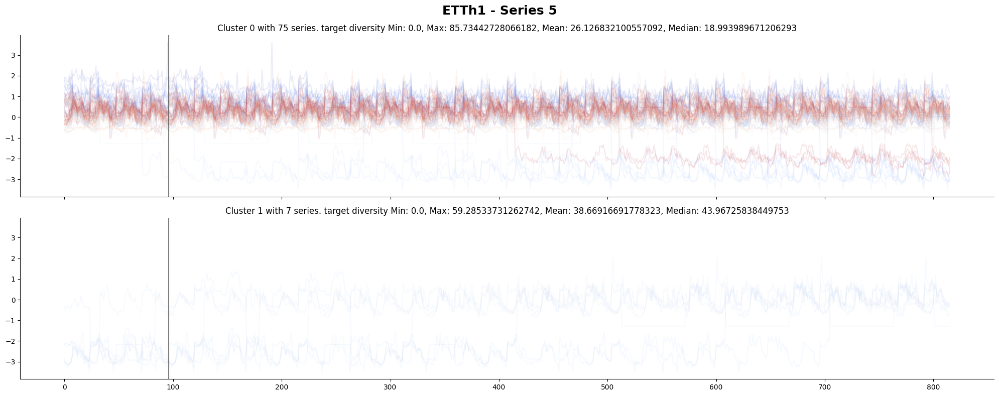

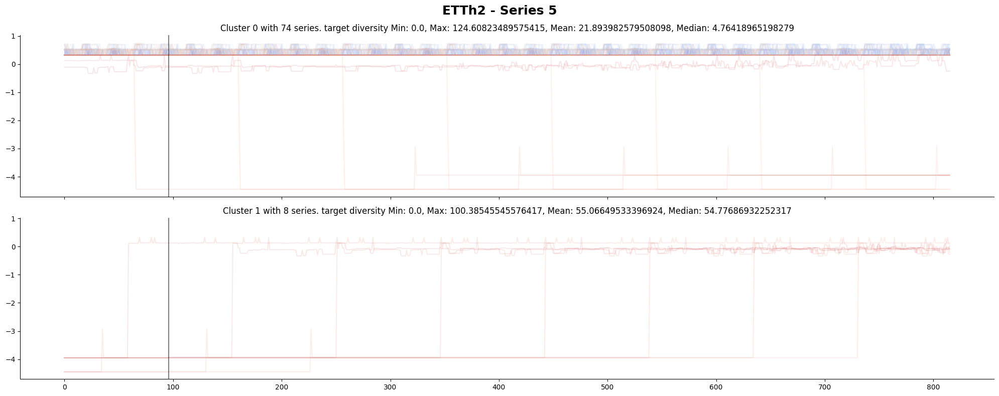

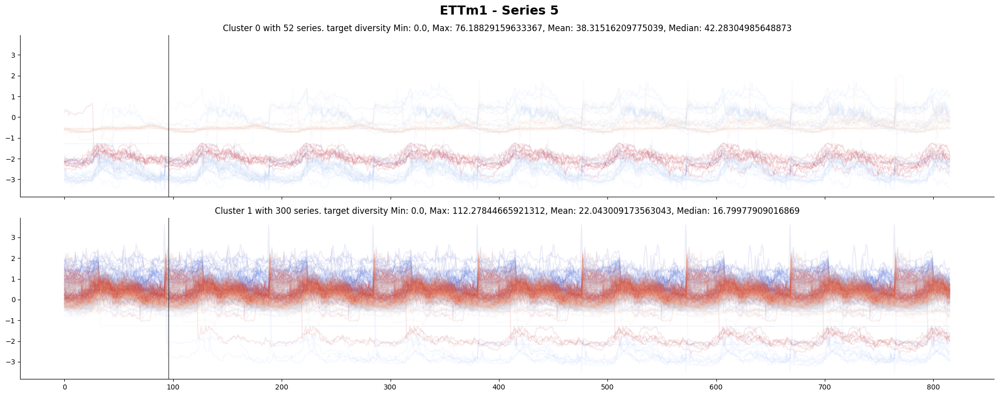

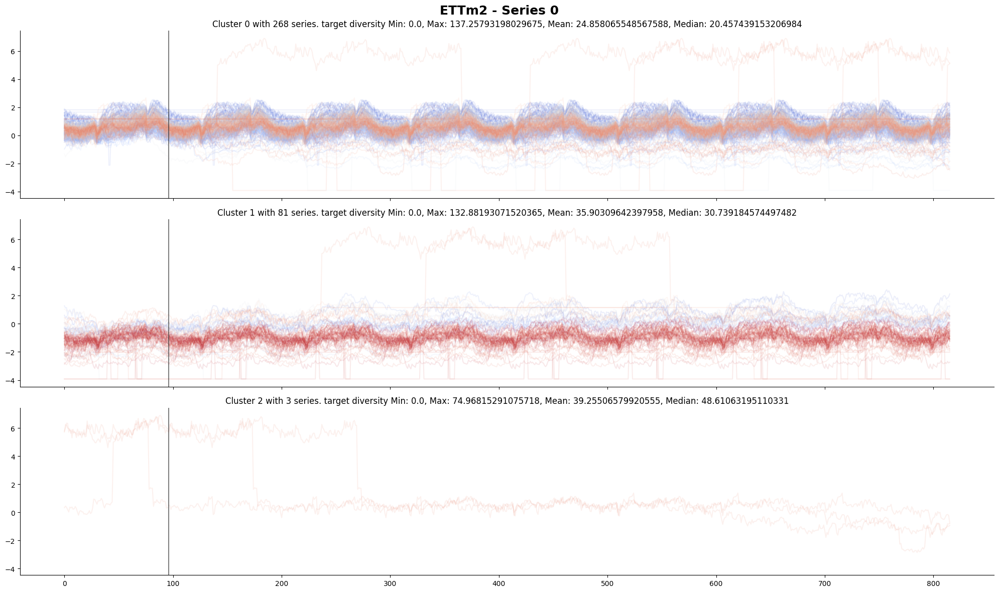

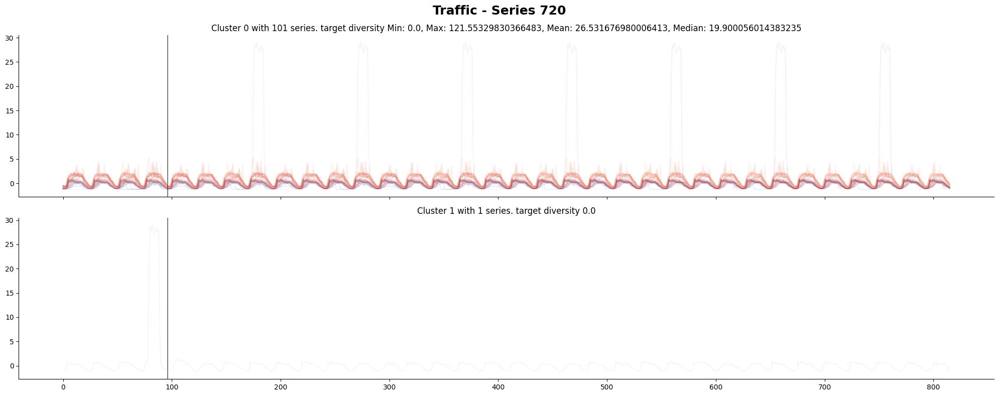

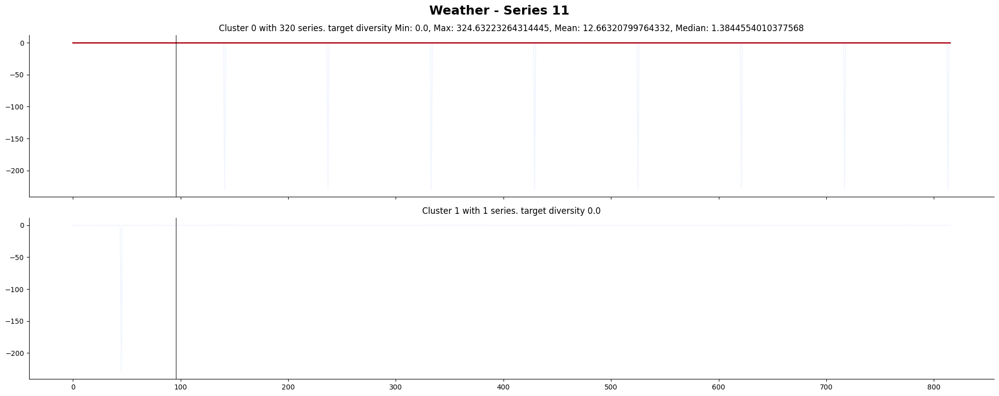

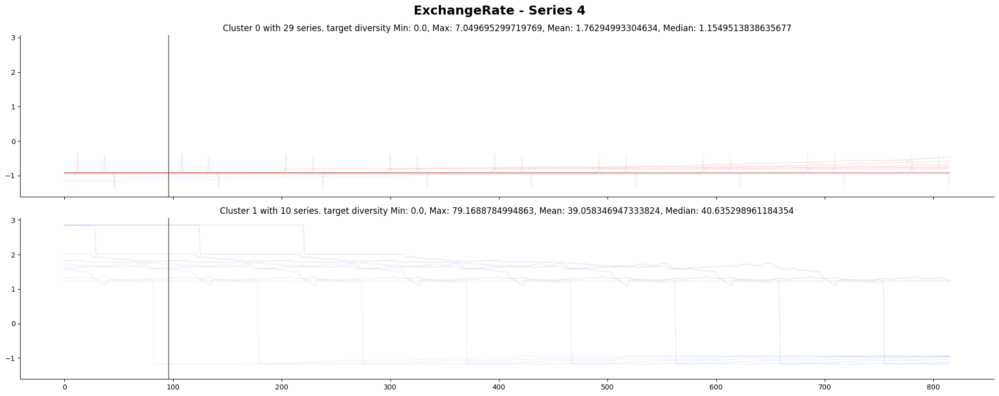

In [5]:
import re
import pickle
import numpy as np
import seaborn as sns
with open('/pfs/data6/home/ma/ma_ma/ma_kreffert/Probabilistic_LTSF/notebooks/BasicTS/intermediate_results.pkl', 'rb') as f:
    _results = pickle.load(f)
cmap = plt.cm.coolwarm
dataset, input_length, output_length = 'Weather', 96, 720 #144
input_tensor = data_sets[dataset]["train"].data # torch.cat([torch.tensor(data_sets[dataset]["train"].data), 
           # torch.tensor(data_sets[dataset]["val"].data), 
           # torch.tensor(data_sets[dataset]["test"].data)],dim=0)
data = create_data(input_tensor, input_length=96, output_length=720, moving_window=True, scaler=data_sets[dataset]["scaler"])
all_inputs, all_targets = data['inputs'], data['target']
# print(_results['ETTh1']['dim_0_diversity'])
max_diversities = {"ETTh1":85.73442728066182,
                    "ETTh2":124.60823489575415,
                   "ETTm1":112.27844665921312,
                   "ETTm2":137.25793198029675,
                   "Traffic":121.55329830366483,
                   "Weather":324.63223264314445, 
                   "ExchangeRate":79.1688784994863, 
                   #"Illness":0,
                  }
input_length, output_length = 96, 720 #144
for dataset in max_diversities.keys():
    input_tensor = data_sets[dataset]["train"].data # torch.cat([torch.tensor(data_sets[dataset]["train"].data), 
               # torch.tensor(data_sets[dataset]["val"].data), 
               # torch.tensor(data_sets[dataset]["test"].data)],dim=0)
    data = create_data(input_tensor, input_length=96, output_length=720, moving_window=True, scaler=data_sets[dataset]["scaler"])
    all_inputs, all_targets = data['inputs'], data['target']
    for dim in range(all_inputs.shape[-1]):
        clusters = _results[dataset][f'dim_{dim}']
        if (clusters is not None):
            num_clusters = max(clusters) + 1
    
            _max_diversities = []
            
            for i in range(num_clusters):
                stat_str = _results[dataset][f"dim_{dim}_diversity"][f"cluster_{i}"]
                if isinstance(stat_str, float):
                    _max_diversities.append(stat_str)
                else:
                    match = re.search(r'Max:\s*([0-9.]+)', stat_str)
                    if match:
                        max_val = float(match.group(1))
                        _max_diversities.append(max_val)
            if max_diversities[dataset]<=max(_max_diversities):
                
                fig, axes = plt.subplots(num_clusters, 1, figsize=(20, 4 * num_clusters), sharex=True, sharey=True)
                num_lines = all_inputs.shape[0]
                for i in range(num_clusters):
                    ax = axes[i]
                    indices = np.where(clusters == i)[0]
                    for j in indices:
                        color = cmap(j / num_lines)
                        ax.plot(range(all_inputs.shape[1]), all_inputs[j, :, dim], color=color, alpha=0.1)#colors[i % len(colors)], alpha=0.1)
                        ax.plot(range(all_inputs.shape[1], all_inputs.shape[1]+output_length), all_targets[j, :output_length, dim], color=color, alpha=0.1)#color=colors[i % len(colors)], alpha=0.1)
                    ax.set_title(f'Cluster {i} with {len(indices)} series. target diversity {_results[dataset][f"dim_{dim}_diversity"][f"cluster_{i}"]}')
                    ax.axvline(all_inputs.shape[1], color='black', alpha=0.5)
                
                # plt.xlabel('Time')
                fig.suptitle(f"{dataset} - Series {dim}", fontsize=18, fontweight='bold')
                plt.tight_layout()
                sns.despine(left=False, bottom=False)
                
                # Create a single legend for the entire figure
                # Collect handles and labels from the last subplot (they should be consistent across all subplots)
                handles, labels = axes[-1].get_legend_handles_labels()
                plt.savefig(f"plots/{dataset}.pdf", format='pdf', dpi=600, bbox_inches='tight')

                plt.show()

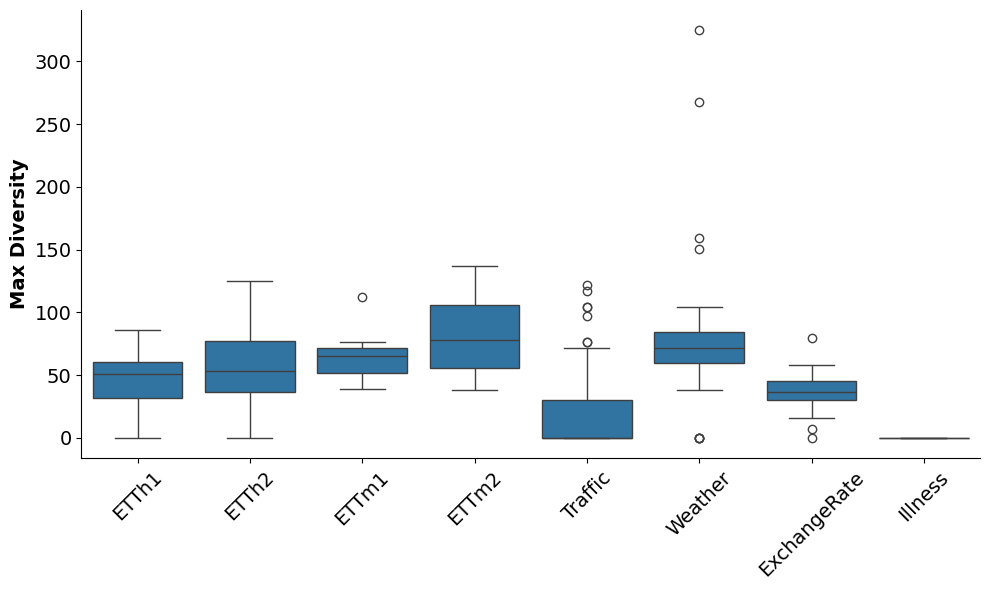

In [13]:
#boxplot
import re
import pickle
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

with open('/pfs/data6/home/ma/ma_ma/ma_kreffert/Probabilistic_LTSF/notebooks/BasicTS/intermediate_results.pkl', 'rb') as f:
    _results = pickle.load(f)

all_max_diversities = []

for dataset in _results.keys():
    for key in _results[dataset].keys():
        if key.endswith('_diversity'):
            for cluster_key, stat in _results[dataset][key].items():
                if isinstance(stat, float):
                    val = stat
                else:
                    match = re.search(r'Max:\s*([0-9.]+)', stat)
                    if match:
                        val = float(match.group(1))
                    else:
                        continue
                all_max_diversities.append({'dataset': dataset, 'max_diversity': val})

# Convert to seaborn-friendly format
import pandas as pd
df = pd.DataFrame(all_max_diversities)
# fig, axes = plt.subplots(num_clusters, 1, figsize=(20, 4 * num_clusters), sharex=True, sharey=True)
fig, ax = plt.subplots(figsize=(10, 6))
sns.boxplot(x='dataset', y='max_diversity', data=df)
ax.set_xlabel('', fontsize=20, fontweight='bold')
ax.set_ylabel('Max Diversity', fontsize=14, fontweight='bold')
plt.xticks(rotation=45)
ax.tick_params(axis='both', labelsize=14)
# plt.title("Distribution of Max Diversity Values per Dataset")
plt.tight_layout()
sns.despine()
plt.savefig("plots/max_diversity_boxplot.pdf", format='pdf', dpi=600, bbox_inches='tight')
plt.show()


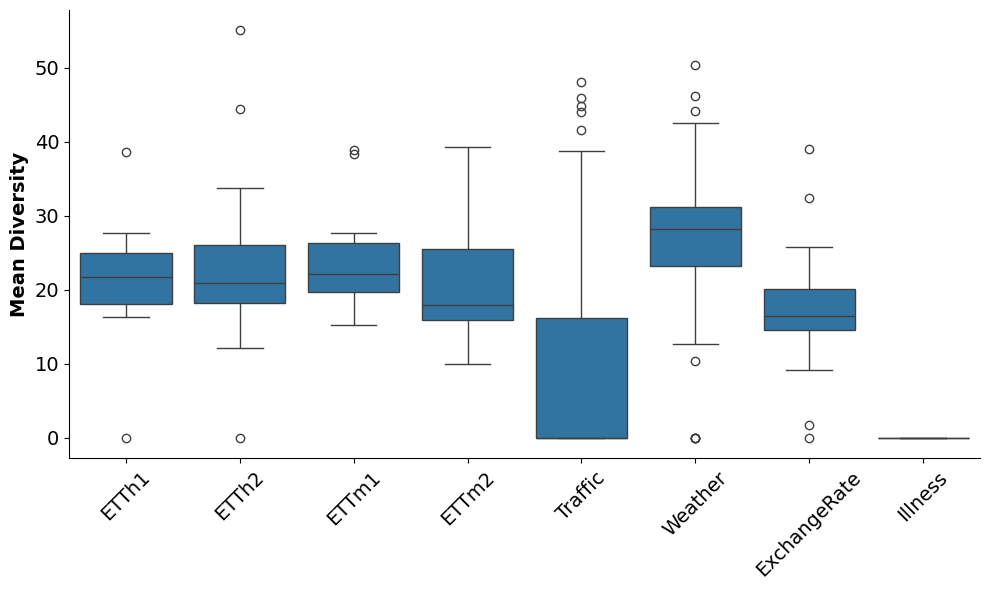

In [14]:
#boxplot
import re
import pickle
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

with open('/pfs/data6/home/ma/ma_ma/ma_kreffert/Probabilistic_LTSF/notebooks/BasicTS/intermediate_results.pkl', 'rb') as f:
    _results = pickle.load(f)

all_max_diversities = []

for dataset in _results.keys():
    for key in _results[dataset].keys():
        if key.endswith('_diversity'):
            for cluster_key, stat in _results[dataset][key].items():
                if isinstance(stat, float):
                    val = stat
                else:
                    match = re.search(r'Mean:\s*([0-9.]+)', stat)
                    if match:
                        val = float(match.group(1))
                    else:
                        continue
                all_max_diversities.append({'dataset': dataset, 'mean_diversity': val})

# Convert to seaborn-friendly format
import pandas as pd
df = pd.DataFrame(all_max_diversities)

fig, ax = plt.subplots(figsize=(10, 6))
sns.boxplot(x='dataset', y='mean_diversity', data=df)
ax.set_xlabel('', fontsize=20, fontweight='bold')
ax.set_ylabel('Mean Diversity', fontsize=14, fontweight='bold')
plt.xticks(rotation=45)
ax.tick_params(axis='both', labelsize=14)
# plt.title("Distribution of Max Diversity Values per Dataset")
plt.tight_layout()
sns.despine()
plt.savefig("plots/mean_diversity_boxplot.pdf", format='pdf', dpi=600, bbox_inches='tight')
plt.show()


# ETTh1

/scratch/slurm_tmpdir/job_615200/ipykernel_3432290/3960089671.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  _input = scaler.transform(torch.tensor(input_tensor[start:midpoint, :, : ]))
/scratch/slurm_tmpdir/job_615200/ipykernel_3432290/3960089671.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  _target = scaler.transform(torch.tensor(input_tensor[midpoint:end, :, : ]))


torch.Size([142, 96, 7])


Clustering dims:   0%|          | 0/7 [00:00<?, ?it/s]

cdist_dtw took 2.48 seconds


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 0 Clusters 2, Silhouette Score: -0.8088


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 0 Clusters 3, Silhouette Score: -0.8088


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 0 Clusters 4, Silhouette Score: -1.1067


Clustering dims:  14%|█▍        | 1/7 [00:14<01:29, 14.86s/it]

cdist_dtw took 1.64 seconds


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 1 Clusters 2, Silhouette Score: -0.7502


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 1 Clusters 3, Silhouette Score: -0.7752


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 1 Clusters 4, Silhouette Score: -0.8055


Clustering dims:  29%|██▊       | 2/7 [00:29<01:13, 14.76s/it]

cdist_dtw took 1.60 seconds


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 2 Clusters 2, Silhouette Score: -0.6715


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 2 Clusters 3, Silhouette Score: -1.0243


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 2 Clusters 4, Silhouette Score: -1.1957


Clustering dims:  43%|████▎     | 3/7 [00:46<01:03, 15.99s/it]

cdist_dtw took 1.62 seconds


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 3 Clusters 2, Silhouette Score: -0.5466


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 3 Clusters 3, Silhouette Score: -0.7762


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 3 Clusters 4, Silhouette Score: -0.8811


Clustering dims:  57%|█████▋    | 4/7 [01:01<00:45, 15.21s/it]

cdist_dtw took 1.61 seconds


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 4 Clusters 2, Silhouette Score: -0.6205


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 4 Clusters 3, Silhouette Score: -2.3056


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 4 Clusters 4, Silhouette Score: -1.3066


Clustering dims:  71%|███████▏  | 5/7 [01:18<00:31, 15.95s/it]

cdist_dtw took 1.62 seconds


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 5 Clusters 2, Silhouette Score: -0.3616


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 5 Clusters 3, Silhouette Score: -0.8842


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 5 Clusters 4, Silhouette Score: -0.9704


Clustering dims:  86%|████████▌ | 6/7 [01:36<00:16, 16.76s/it]

cdist_dtw took 1.62 seconds


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 6 Clusters 2, Silhouette Score: -0.8161


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 6 Clusters 3, Silhouette Score: -0.5619


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 6 Clusters 4, Silhouette Score: -0.5869


Clustering dims: 100%|██████████| 7/7 [01:50<00:00, 15.78s/it]


Overall max diversity 79.71698008648563


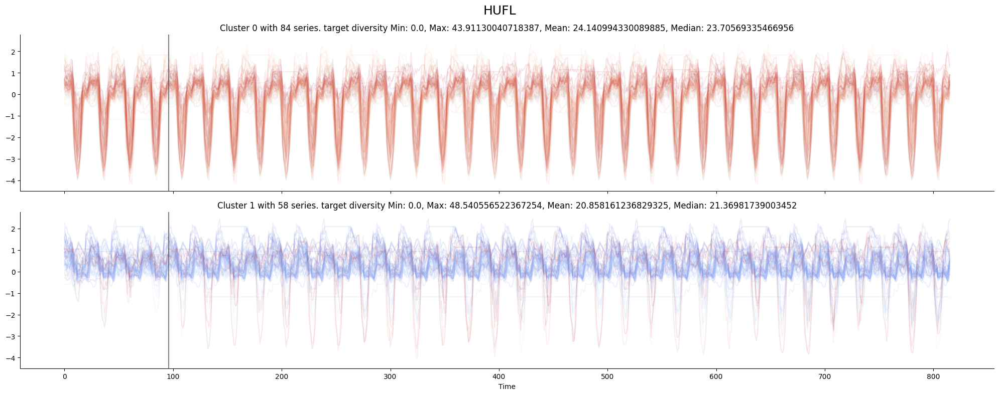

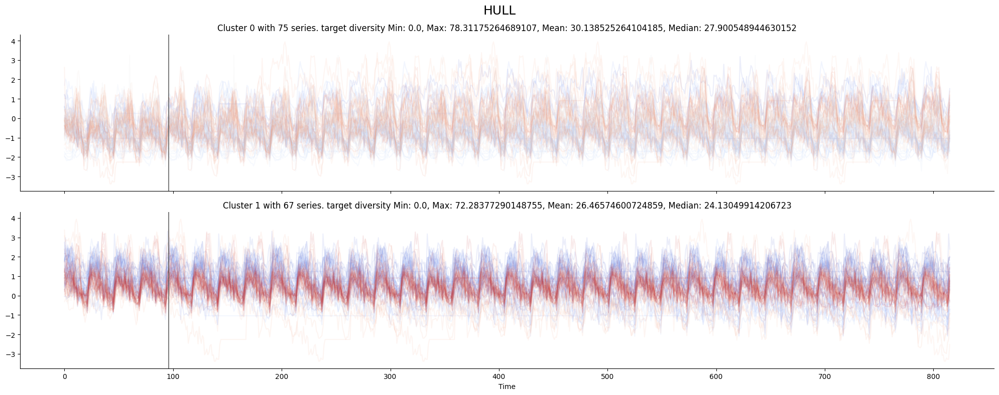

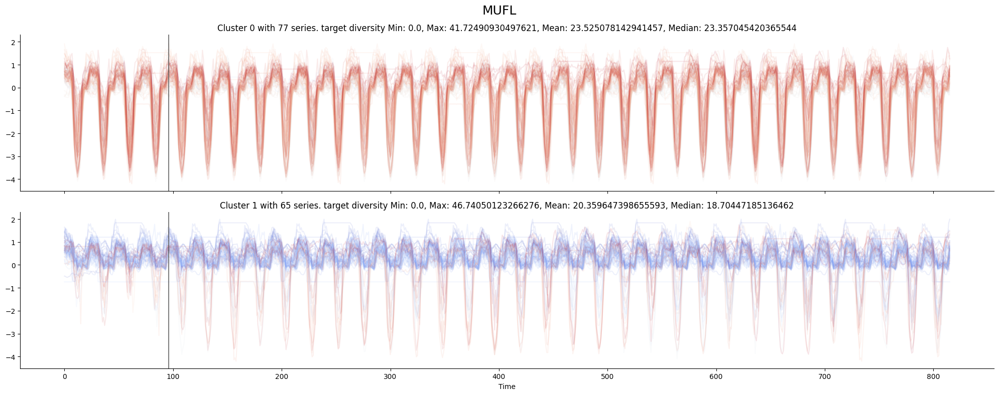

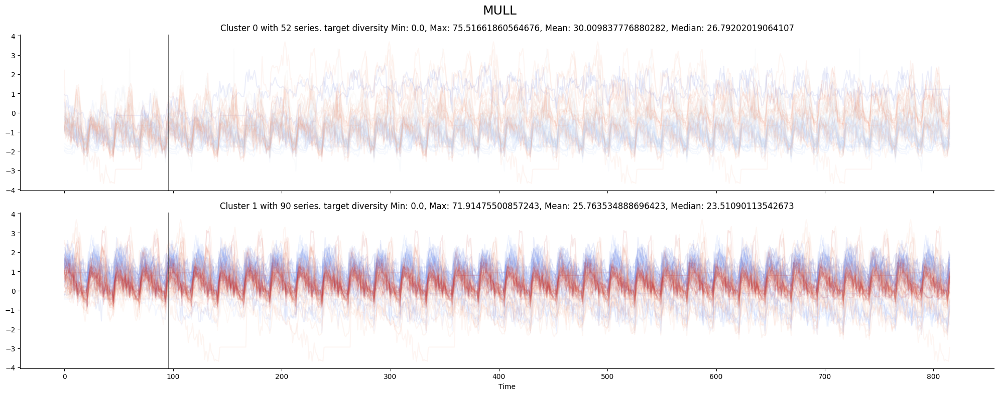

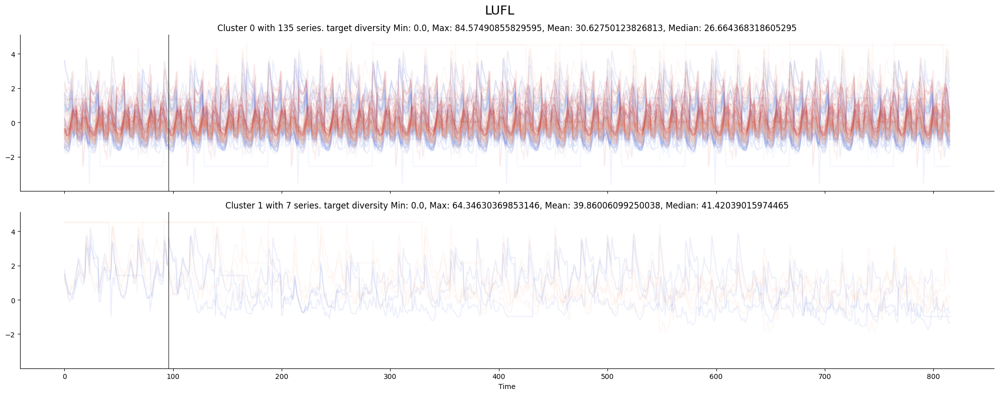

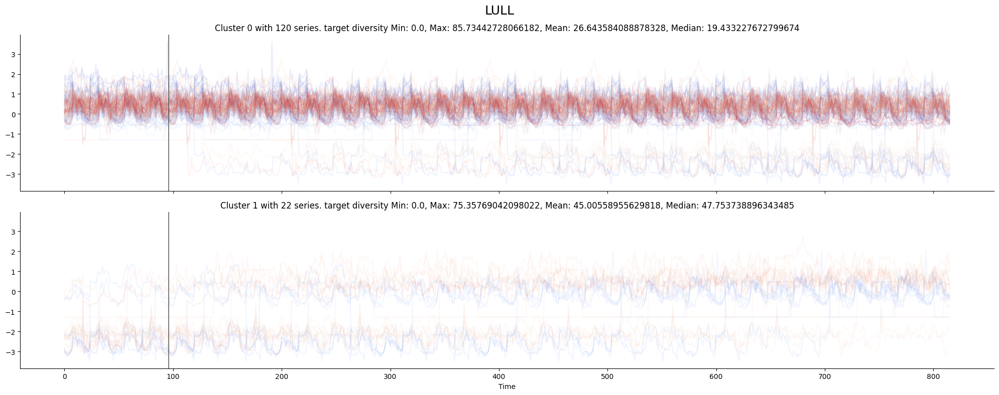

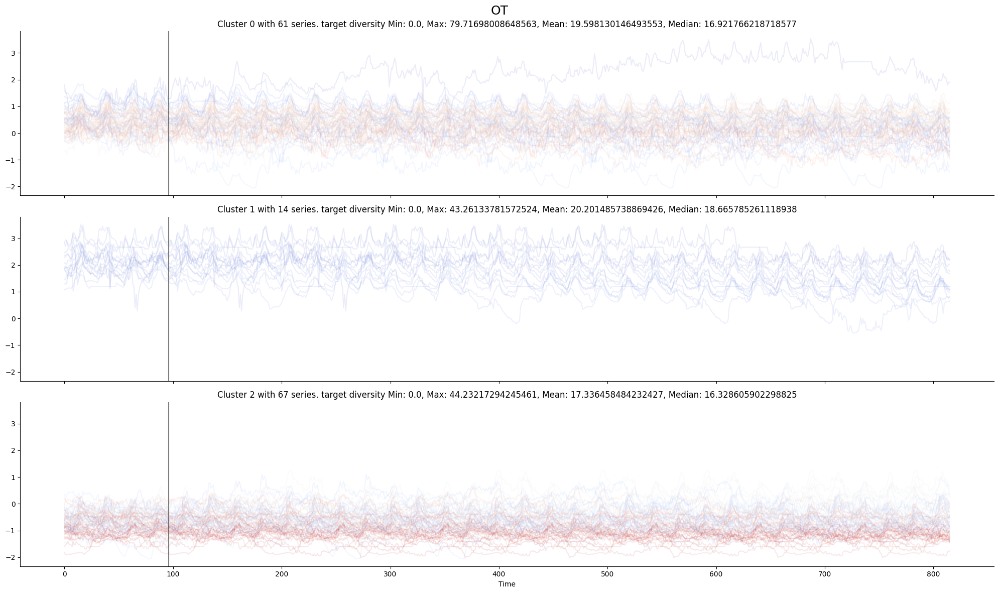

In [5]:
import seaborn as sns
cmap = plt.cm.coolwarm

from collections import Counter
# "ETTh1", "ETTh2", "ETTm1", "ETTm2", "Traffic", "Weather", "ExchangeRate", "Illness"
dataset, input_length, output_length = 'ETTh1', 96, 720 #144
input_tensor = torch.cat([torch.tensor(data_sets[dataset]["train"].data), 
           torch.tensor(data_sets[dataset]["val"].data), 
           torch.tensor(data_sets[dataset]["test"].data)],dim=0)
data = create_data(input_tensor, input_length=input_length, output_length=output_length, moving_window=True, scaler=data_sets[dataset]["scaler"])
all_inputs, all_targets = data['inputs'], data['target']
print(all_inputs.shape)
results = cluster_by_last_dim(
    all_inputs,
    all_targets,
    max_clusters= 4,
)
names=["HUFL", "HULL", "MUFL", "MULL", "LUFL", "LULL", "OT" ]
for dim in range(min(7, all_inputs.shape[-1])):
    clusters = results[f'dim_{dim}']
    num_clusters = max(clusters) + 1
    colors = ['red', 'green', 'blue', 'black', 'grey', 'purple', 'orange']
    
    fig, axes = plt.subplots(num_clusters, 1, figsize=(20, 4 * num_clusters), sharex=True, sharey=True)
    num_lines = all_inputs.shape[0]
    for i in range(num_clusters):
        ax = axes[i]
        indices = np.where(clusters == i)[0]
        for j in indices:
            color = cmap(j / num_lines)
            ax.plot(range(all_inputs.shape[1]), all_inputs[j, :, dim], color=color, alpha=0.1)#colors[i % len(colors)], alpha=0.1)
            ax.plot(range(all_inputs.shape[1], all_inputs.shape[1]+output_length), all_targets[j, :output_length, dim], color=color, alpha=0.1)#color=colors[i % len(colors)], alpha=0.1)
        ax.set_title(f'Cluster {i} with {len(indices)} series. target diversity {results[f"dim_{dim}_diversity"][f"cluster_{i}"]}')
        ax.axvline(all_inputs.shape[1], color='black', alpha=0.5)
    
    plt.xlabel('Time')
    fig.suptitle(f"{names[dim]}", fontsize=18)
    plt.tight_layout()
    sns.despine(left=False, bottom=False)
    
    # Create a single legend for the entire figure
    # Collect handles and labels from the last subplot (they should be consistent across all subplots)
    handles, labels = axes[-1].get_legend_handles_labels()
    plt.show()

cdist_dtw took 6.32 seconds


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Silhouette Score: 0.4927


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Silhouette Score: 0.4048


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Silhouette Score: 0.4156
cdist_dtw took 0.21 seconds


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Silhouette Score: 0.2282


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Silhouette Score: 0.0628


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Silhouette Score: 0.0786


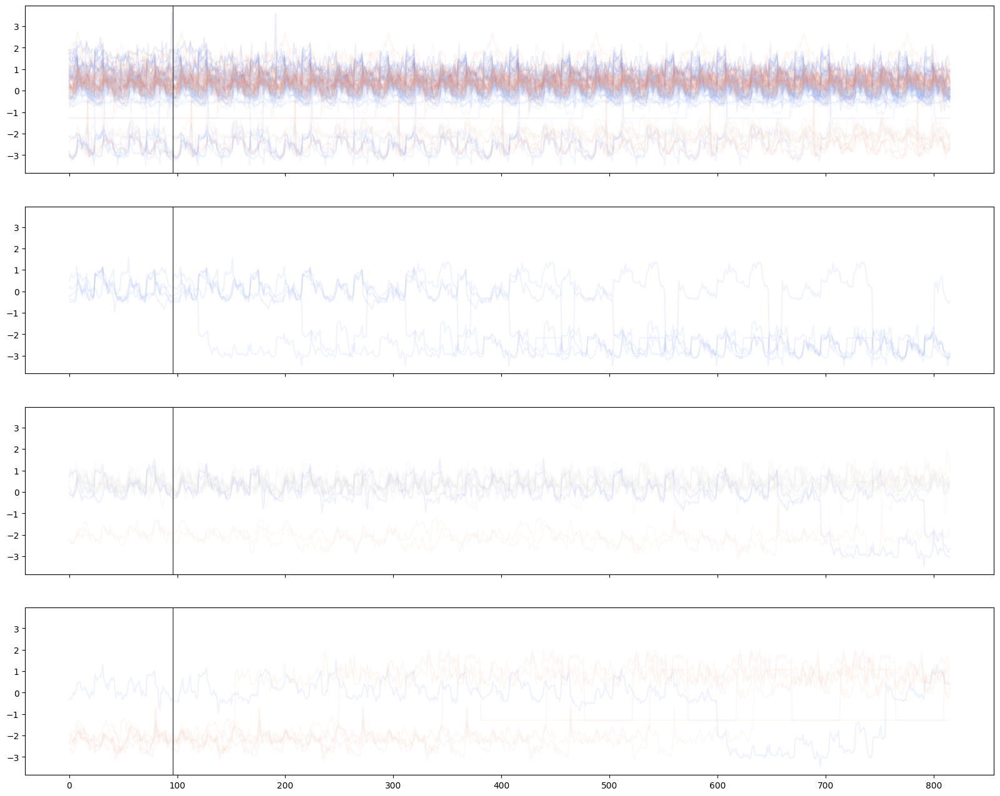

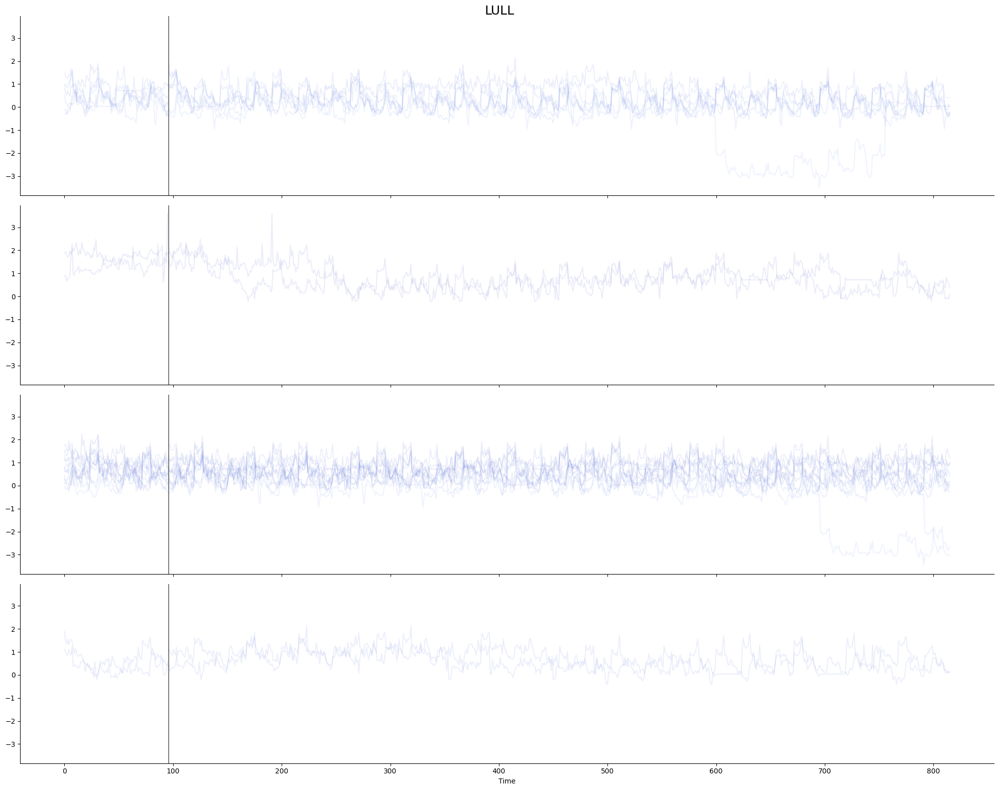

In [9]:
def cluster(X, max_clusters=5):
    X_3d = targets[:, :, np.newaxis]
    start_time = time.time()
    dist_matrix = cdist_dtw(X, global_constraint='sakoe_chiba', n_jobs=-1, be='numpy') #itakura”, “sakoe_chiba”
    end_time = time.time()
    print(f"cdist_dtw took {end_time - start_time:.2f} seconds")
    for k in range(2, max_clusters+1):
        best_score = -1
        best_labels = None
        best_k = 1
        
        model = TimeSeriesKMeans(n_clusters=k, metric="dtw", max_iter=10,
                                 random_state=42, n_jobs=-1)
        labels = model.fit_predict(X_3d)

        try:
            # sil_score = davies_bouldin_score(dist_matrix, labels)*-1
            # sil_score = model.inertia_
            sil_score= silhouette_score(dist_matrix, labels, metric="precomputed")
        except Exception as e:
            sil_score = -1
            if verbose:
                warnings.warn(f"Silhouette score computation failed: {e}")

        print(f"Silhouette Score: {sil_score:.4f}")

        if sil_score >= best_score:
            best_score = sil_score
            best_labels = labels
            best_k = k
    return best_labels



dim = 5
clusters = results[f'dim_{dim}']
num_clusters = max(clusters) + 1

for i in range(num_clusters):
    # retrieve the series from cluster i
    indices = np.where(clusters == i)[0]
    targets = all_targets[indices, :output_length, dim]

    
    
    # then cluster those series
    # new_results = {}
    labels = cluster(targets, max_clusters=4)
    # new_results[f'{dim}'][f'{i}'] = labels
    num_ou = max(labels) + 1
    fig, axes = plt.subplots(num_ou, 1, figsize=(20, 4 * num_ou), sharex=True, sharey=True)
    num_lines = all_inputs.shape[0]
    for o in range(num_ou):
        ax = axes[o]
        o_indices = np.where(labels == o)[0]
        for oi in o_indices:
            color = cmap(oi / num_lines)
            ax.plot(range(all_inputs.shape[1]), all_inputs[oi, :, dim], color=color, alpha=0.1)#colors[i % len(colors)], alpha=0.1)
            ax.plot(range(all_inputs.shape[1], all_inputs.shape[1]+output_length), all_targets[oi, :output_length, dim], color=color, alpha=0.1)#color=colors[i % len(colors)], alpha=0.1)
        # ax.set_title(f'Cluster {i} with {len(indices)} series. target diversity {results[f"dim_{dim}_diversity"][f"cluster_{i}"]}')
        ax.axvline(all_inputs.shape[1], color='black', alpha=0.5)

plt.xlabel('Time')
fig.suptitle(f"{names[dim]}", fontsize=18)
plt.tight_layout()
sns.despine(left=False, bottom=False)

# Create a single legend for the entire figure
# Collect handles and labels from the last subplot (they should be consistent across all subplots)
handles, _ = axes[-1].get_legend_handles_labels()
plt.show()

In [ ]:
dim = 5
clusters = results[f'dim_{dim}']
num_clusters = max(clusters) + 1

fig, axes = plt.subplots(num_clusters, 1, figsize=(20, 4 * num_clusters), sharex=True, sharey=True)
num_lines = all_inputs.shape[0]
for i in range(num_clusters):
    ax = axes[i]
    indices = np.where(clusters == i)[0]
    for j in indices:
        color = cmap(j / num_lines)
        ax.plot(range(all_inputs.shape[1]), all_inputs[j, :, dim], color=color, alpha=0.1)#colors[i % len(colors)], alpha=0.1)
        ax.plot(range(all_inputs.shape[1], all_inputs.shape[1]+output_length), all_targets[j, :output_length, dim], color=color, alpha=0.1)#color=colors[i % len(colors)], alpha=0.1)
    ax.set_title(f'Cluster {i} with {len(indices)} series. target diversity {results[f"dim_{dim}_diversity"][f"cluster_{i}"]}')
    ax.axvline(all_inputs.shape[1], color='black', alpha=0.5)

plt.xlabel('Time')
fig.suptitle(f"{names[dim]}", fontsize=18)
plt.tight_layout()
sns.despine(left=False, bottom=False)

# Create a single legend for the entire figure
# Collect handles and labels from the last subplot (they should be consistent across all subplots)
handles, labels = axes[-1].get_legend_handles_labels()
plt.show()

# ETTm1

In [ ]:
cmap = plt.cm.coolwarm

from collections import Counter
# "ETTh1", "ETTh2", "ETTm1", "ETTm2", "Traffic", "Weather", "ExchangeRate", "Illness"
dataset, input_length, output_length = 'ETTm1', 96, 720 #144
input_tensor = torch.cat([torch.tensor(data_sets[dataset]["train"].data), 
           torch.tensor(data_sets[dataset]["val"].data), 
           torch.tensor(data_sets[dataset]["test"].data)],dim=0)
data = create_data(input_tensor, input_length=input_length, output_length=output_length, moving_window=True, scaler=data_sets[dataset]["scaler"])
all_inputs, all_targets = data['inputs'], data['target']
print(all_inputs.shape)
results = cluster_by_last_dim(
    all_inputs,
    all_targets,
    max_clusters= 4,
)
labels=["HUFL", "HULL", "MUFL", "MULL", "LUFL", "LULL", "OT" ]
for dim in range(min(7, all_inputs.shape[-1])):
    clusters = results[f'dim_{dim}']
    num_clusters = max(clusters) + 1
    colors = ['red', 'green', 'blue', 'black', 'grey', 'purple', 'orange']
    
    fig, axes = plt.subplots(num_clusters, 1, figsize=(30, 4 * num_clusters), sharex=True, sharey=True)
    num_lines = all_inputs.shape[0]
    for i in range(num_clusters):
        ax = axes[i]
        indices = np.where(clusters == i)[0]
        for j in indices:
            color = cmap(j / num_lines)
            ax.plot(range(all_inputs.shape[1]), all_inputs[j, :, dim], color=color, alpha=0.1)#colors[i % len(colors)], alpha=0.1)
            ax.plot(range(all_inputs.shape[1], all_inputs.shape[1]+output_length), all_targets[j, :output_length, dim], color=color, alpha=0.1)#color=colors[i % len(colors)], alpha=0.1)
        ax.set_title(f'Cluster {i} with {len(indices)} series. target diversity {results[f"dim_{dim}_diversity"][f"cluster_{i}"]}')
        ax.axvline(all_inputs.shape[1], color='black', alpha=0.5)
    
    plt.xlabel('Time')
    fig.suptitle(f"{labels[dim]}", fontsize=18)
    plt.tight_layout()
    sns.despine(left=False, bottom=False)
    
    # Create a single legend for the entire figure
    # Collect handles and labels from the last subplot (they should be consistent across all subplots)
    handles, labels = axs[-1, -1].get_legend_handles_labels()
    plt.show()

/scratch/slurm_tmpdir/job_615200/ipykernel_3418560/3960089671.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  _input = scaler.transform(torch.tensor(input_tensor[start:midpoint, :, : ]))
/scratch/slurm_tmpdir/job_615200/ipykernel_3418560/3960089671.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  _target = scaler.transform(torch.tensor(input_tensor[midpoint:end, :, : ]))


torch.Size([592, 96, 7])


Clustering dims:   0%|          | 0/7 [00:00<?, ?it/s]

cdist_dtw took 28.03 seconds


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 0 Clusters 2, Silhouette Score: -0.7470


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 0 Clusters 3, Silhouette Score: -2.1044


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 0 Clusters 4, Silhouette Score: -1.6470


Clustering dims:  14%|█▍        | 1/7 [02:41<16:08, 161.40s/it]

cdist_dtw took 27.93 seconds


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Dim 1 Clusters 2, Silhouette Score: -0.7266


/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/bwhpc/common/jupyter/ai/2025-02-20/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
